## Visualize results

#### Import libraries

In [43]:
from pyproj import CRS
import geopandas as gpd
from functools import reduce
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import contextily as ctx

#### Read population, rails and stations data

In [44]:
# Read rails data
fp = "railway_data/railways.shp"
rails = gpd.read_file(fp)

# Read population data
fp = "population_data/population.shp"
population = gpd.read_file(fp)

# Read stations data
fp = "stations_data/stations.shp"
stations = gpd.read_file(fp)

#### Set coordinate reference system

In [45]:
# Rails
rails = rails.to_crs(epsg=3857)

# Population all years
population = population.to_crs(epsg=3857)

# Stations
stations = stations.to_crs(epsg=3857)

# Check that they all have same CRS
print("All have same CRS: ", rails.crs == population.crs == stations.crs)

All have same CRS:  True


#### Create and save annual images

Year 1997 Population 6944
Year 1998 Population 5918
Year 1999 Population 6127
Year 2000 Population 8021
Year 2001 Population 8077
Year 2002 Population 6723
Year 2003 Population 6803
Year 2008 Population 6723
Year 2009 Population 6631
Year 2010 Population 6705
Year 2011 Population 6706
Year 2012 Population 6961
Year 2013 Population 7029
Year 2014 Population 6951
Year 2015 Population 7100
Year 2016 Population 7090
Year 2017 Population 7132
Year 2018 Population 7078
Year 2019 Population 6998


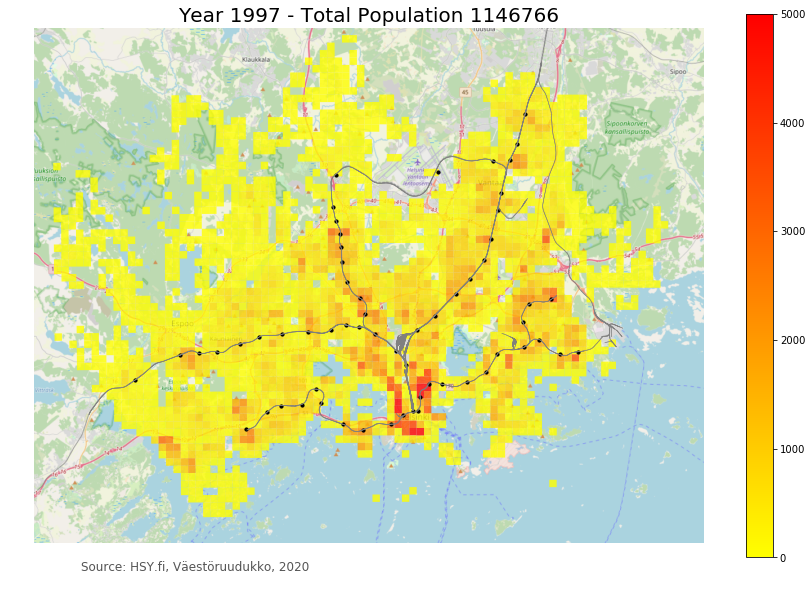

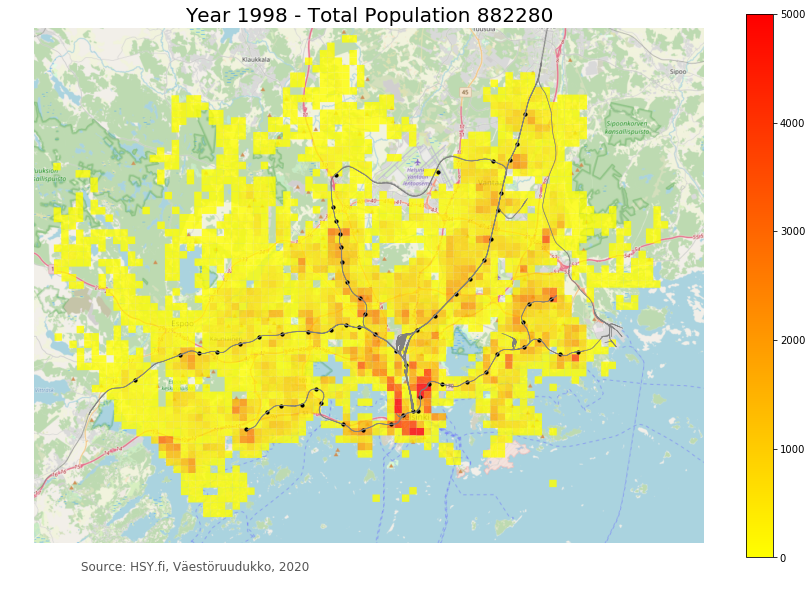

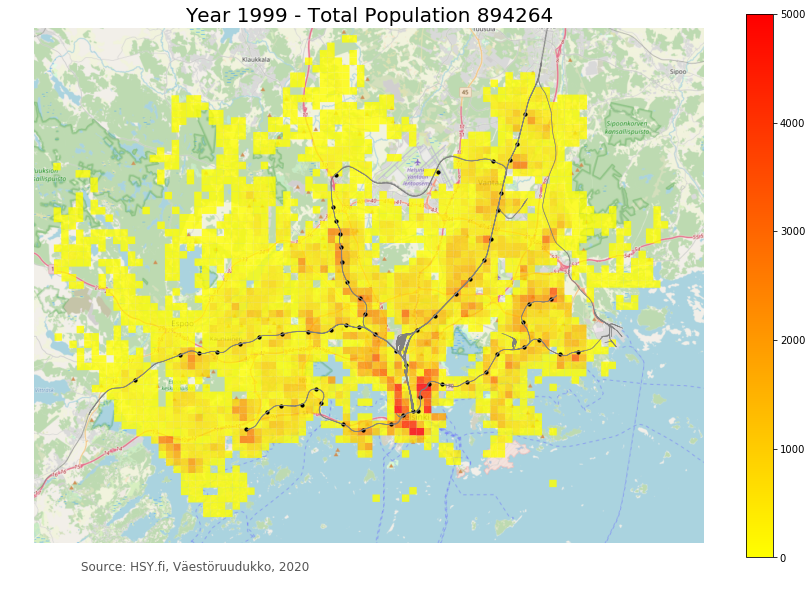

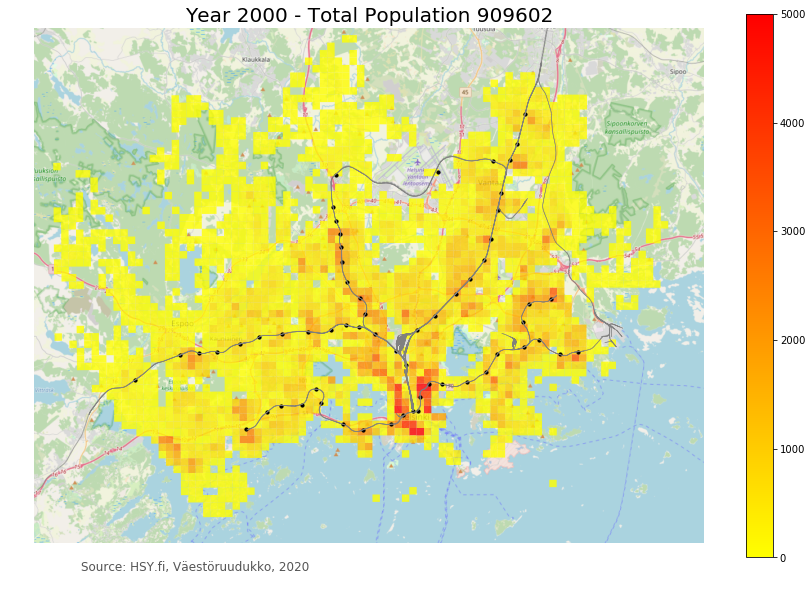

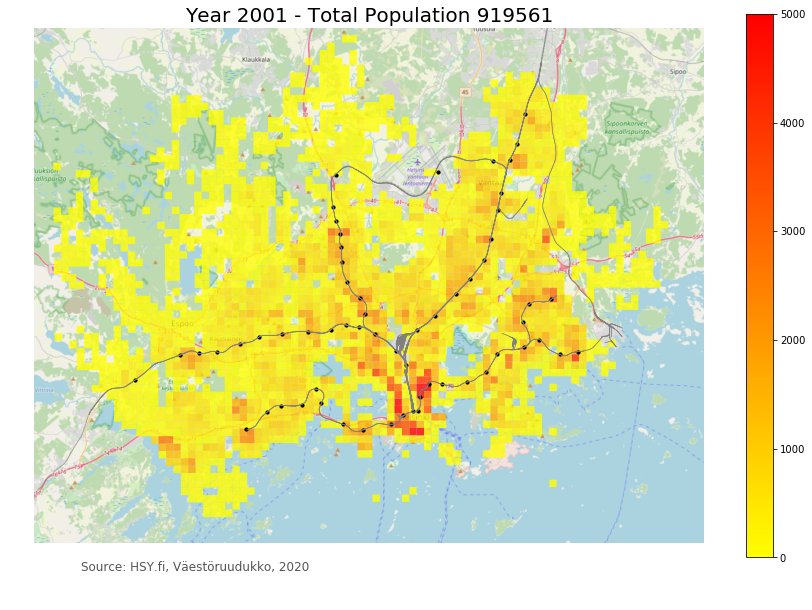

...

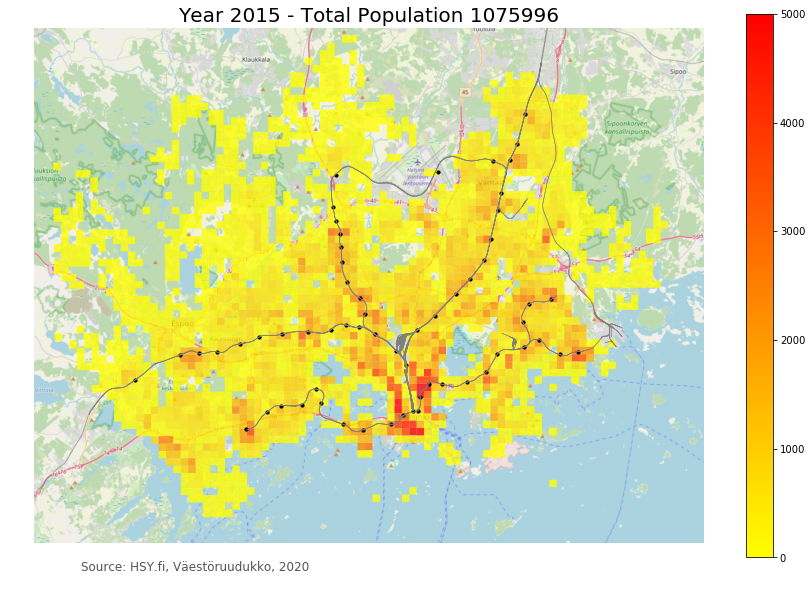

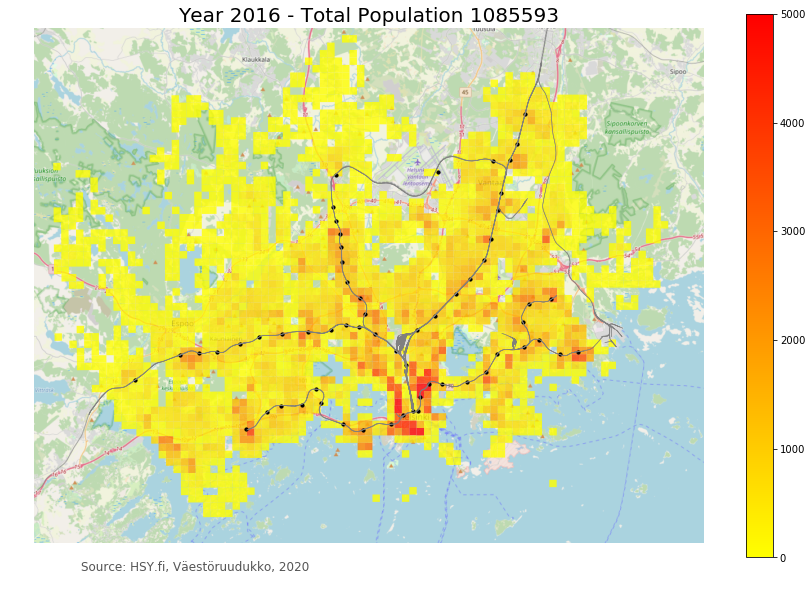

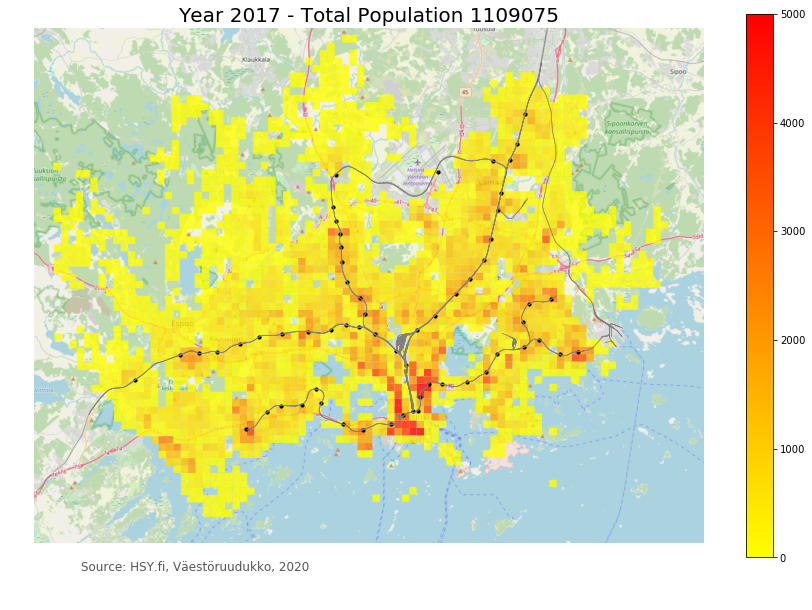

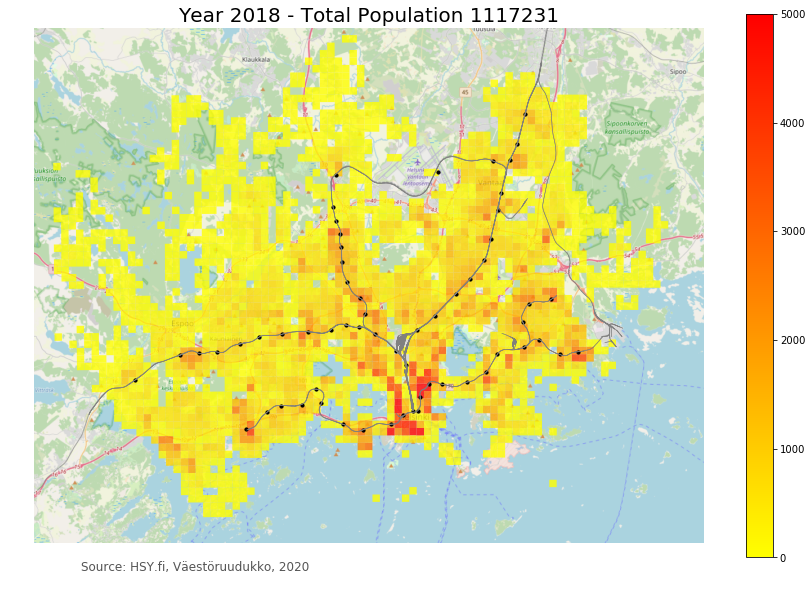

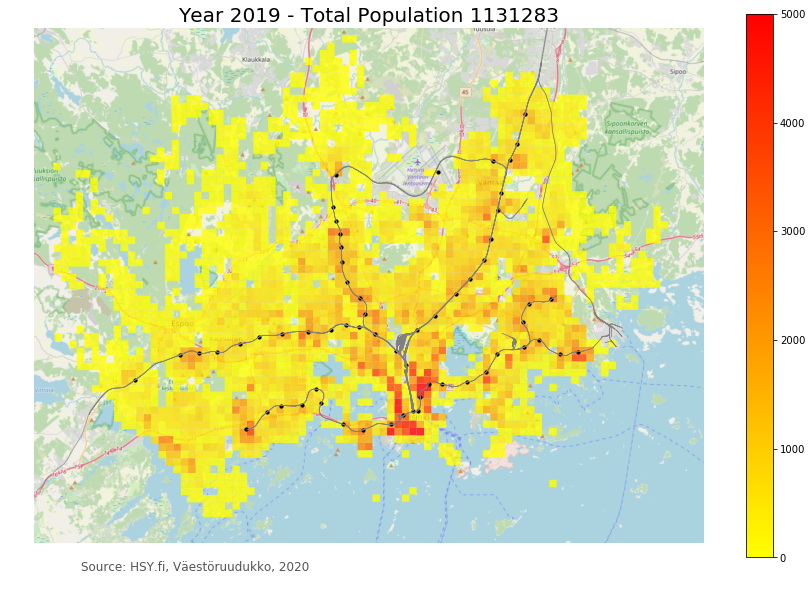

In [46]:
# Create and save figure of every year in the seleted list

# Select colour map
#cmap = matplotlib.cm.autumn
cmap = matplotlib.cm.get_cmap('autumn_r')
#cmap = matplotlib.cm.gnuplot
#cmap = matplotlib.cm.get_cmap('gnuplot_r')

# Create years list
years = [1997, 1998, 1999, 2000, 2001, 2002, 2003, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]

# Loop through years and create and save figures
for year in years:
    
    # Print annual max population in one grid. Used to set colour range maximum.
    #max_population = int(round(population[column_name].max()))
    #print("Year" , year, "Population", max_population)
    
    # Define variable total population and change type to integer
    total_population = int(round(population[column_name].sum()))
    
    # set the range for the choropleth
    vmin, vmax = 0, 5000

    # Set column name which to visualize
    column_name = "pop"+str(year)
    
    # create figure and axes for Matplotlib
    fig, ax = plt.subplots(1, figsize=(15, 10))

    # Plot the population data
    pop.plot(ax=ax, column=column_name, cmap=cmap, linewidth=0.5, alpha=0.8, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    
    # Plot the rails
    rails.plot(ax=ax, color="gray", linewidth=0.5)
    
    # Plot stations
    stations.plot(ax=ax, color="black", markersize=10)

    # remove the axis
    ax.axis("off")

    # add a title
    ax.set_title("Year " +str(year) + " - Total Population " + str(total_population), 
                 fontdict={"fontsize": "20", "fontweight" : "3"})

    # Add source to the bottom left corner
    ax.annotate("Source: HSY.fi, Väestöruudukko, 2020",xy=(0.1, .08), xycoords="figure fraction", 
                horizontalalignment="left", verticalalignment="top", fontsize=12, color="#555555")
    
    # Create colorbar as a legend
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

    # empty array for the data range
    sm._A = []

    # Add the colorbar to the figure
    cbar = fig.colorbar(sm)

    # Add basemap with `OSM_A` style
    ctx.add_basemap(ax, url=ctx.tile_providers.OSM_A)

    # Crop the figure
    ax.set_xlim(2725000, 2816000)
    ax.set_ylim(8420000, 8490000)

    #saving our map as .png file.
    fig.savefig("pics_all_population/"+column_name+".png", dpi=100)